**Introduction**

Bigfoot, also called Sasquatch, a large, hairy, humanlike creature believed by some people to exist in the northwestern United States and western Canada. Sasquatch is variably described as a primate ranging from 6 to 15 feet (2 to 4.5 metres) tall, standing erect on two feet, often giving off a foul smell, and either moving silently or emitting a high-pitched cry. Footprints have measured up to 24 inches (60 cm) in length and 8 inches (20 cm) in width.
Some people credit the British explorer David Thompson with the first discovery of Sasquatch footprints, in 1811. Since then, several people have claimed to have found such footprints or to have seen Sasquatch, and some have provided purported documentary evidence. However, scholars and scientific researchers have pointed out that no investigator has produced a physical body or other verifiable evidence, and they do not recognize Sasquatch’s existence.
Through this project we try to explore the given datasets (Bigfoot Sightings, County Data and County Geography Location) to find out what social/economic/geographic/climatic/political characteristics of a US county are associated with Bigfoot sightings. Look for if any trends are there in the number of reported Bigfoot sightings over time and is there a common narrative of a common physical description of Bigfoot.
The Bigfoot Sightings file (bigfoot.csv) includes descriptions of the sightings, location, latitudes, longitudes, dates and other details. The County Data file (county_data.csv) includes county and states names, income and population data for all US counties. The County Geography Location file (county_geo.zip) includes geography location data for all US counties.

*https://www.britannica.com/topic/Sasquatch*

In [1019]:
import os
import numpy as np
import pandas as pd
import geopandas as gpd


from wordcloud import WordCloud, STOPWORDS


import matplotlib.pyplot as plt
# import seaborn as sns

import re
from PIL import Image
from pprint import pprint

gv=gpd.__version__.split('.')
assert int(gv[1]) >= 10, f'{gpd.__version__} not compatible. need minimum 0.10.0'

import nltk
from nltk.tokenize import word_tokenize
# from nltk.tag import pos_tag

import spacy
from spacy import displacy
import en_core_web_sm

nlp = en_core_web_sm.load()
all_stopwords = nlp.Defaults.stop_words

print("nltk data path: " + ','.join([ p for p in nltk.data.path if os.path.exists(p)]))

import os, fnmatch
def find_nltk_downloads(path):
    result = []
    for root, dirs, files in os.walk(path):
        for name in files:
            if fnmatch.fnmatch(name, '*.zip'):
                result.append(os.path.join(root, name))
    return result

nltk_dwnlds=[]
for p in nltk.data.path:
    if not os.path.exists(p):
        continue
    [ nltk_dwnlds.append(os.path.basename(x)) for x in find_nltk_downloads(p) ]

print("Found already downloaded nltk data " + ', '.join(nltk_dwnlds))

for nlkt_d in ('punkt', 'averaged_perceptron_tagger', 'maxent_ne_chunker', 'words'):
    if nltk_dwnlds.__contains__(nlkt_d+'.zip'):
        continue
    nltk.download(nlkt_d)

import calendar
from datetime import datetime
from datetime import timedelta



nltk data path: /Users/soubhik1c/nltk_data
Found already downloaded nltk data punkt.zip, maxent_ne_chunker.zip, averaged_perceptron_tagger.zip, stopwords.zip, words.zip


In [1020]:
bgft = pd.read_csv("bigfoot.csv")
state_g = gpd.read_file("state_geo/states.shp")
countz_g = gpd.read_file("county_geo/cb_2018_us_county_5m.shp")
countz_d = pd.read_csv('county_data.csv')
not_mainland = ['Alaska', 'Hawaii', "Puerto Rico"]
state_g=state_g.query('STATE_NAME not in @not_mainland')
mainland_countz_g=countz_g.merge(state_g[['STATE_NAME', 'STATE_FIPS']], left_on='STATEFP', right_on='STATE_FIPS', how='inner')

In [1021]:
# try to extract date from description for the missing rows
# alert: this takes a while, so saving it in a pickle file.

bgft_dd_pkl_fn='bigfoot_with_derived_date.pkl'

if not os.path.exists(bgft_dd_pkl_fn):
    no, abr, nm=list(map(lambda x: list(x), list(zip(*[(str(x), calendar.month_abbr[x].lower(), calendar.month_name[x].lower()) for x in range(1,13)]))))

    yre=re.compile('.*\W([0-9]\d{1}|[0-2]\d{3})\W.*')

    us_mmyyre=re.compile('.*\W([0-9]|[0-2]\d{1}|3[0-1])/([0-9]\d{1}|[0-2]\d{3})\W.*')

    def has_month(t):
        mmdd_match = us_mmyyre.match(t)
        if mmdd_match is not None:
            yrstr=mmdd_match.group(2)
            yr_r = "%Y" if len(yrstr.strip()) == 4 else "%y"
            us_dtstr = mmdd_match.group(1)+"/" + yrstr
            return datetime.strptime(us_dtstr, f"%m/{yr_r}").strftime("%m/%Y/%d")


        _month= _yr = ""
        _dy = "15"
        mon_regex="%m"
        yr_regex="%y"
        for w in t.split(' '):
            if abr.__contains__(w):
                _month=w
                mon_regex="%b"
                break
            elif nm.__contains__(w):
                _month=w
                mon_regex="%B"
                break


        if len(_month) == 0:
            return None

        yrmatch=yre.match(f" {t} ")
        if yrmatch is not None:
            _yr=yrmatch.group(1)
        else:
    #         print('no year =>> ' + t)
            return None
        approx_date = _month+"-"+_yr+"-"+_dy
        if len(_yr) == 4:
            yr_regex = "%Y"

        dt_regex = f"{mon_regex}-{yr_regex}-%d"
        return datetime.strptime(approx_date, dt_regex).strftime("%m/%d/%Y")

    def remove_stop_words(t):
        return ' '.join([word for word in word_tokenize(t) if not word in all_stopwords])


    bgft['was_date_na'] = bgft['date'].isna()
    bgft['date_frm_sent'] = np.NaN


    nodate=bgft.loc[ (bgft.date.isna()) , ['date', 'was_date_na', 'date_frm_sent', 'description']]

    def extract_date(desc):
        sentences = nltk.sent_tokenize(str(desc).replace('\n', ''))
        for i in range(len(sentences)):
            sentences[i] = sentences[i].lower()
            sentences[i] = re.sub(r'\W', ' ', sentences[i])
            sentences[i] = re.sub(r'\s+', ' ', sentences[i])
            if len(sentences[i]) <= 0:
                continue
            doc = nlp(remove_stop_words(sentences[i]))
            potential_dates=[]
            for X in doc.ents:
                if X.label_ == 'DATE':
                    dt = has_month(X.text)
                    if (dt is not None):
                        potential_dates.append((dt, X.text))
            if len(potential_dates) > 0:
    #             pprint(potential_dates)
                return potential_dates[0][0], potential_dates[0][1]

        return np.NaN, None


    nodate['date'], nodate['date_frm_sent'] = list(zip(*nodate['description'].apply(extract_date)))

    nodate.to_pickle(bgft_dd_pkl_fn)
else:
    nodate = pd.read_pickle(bgft_dd_pkl_fn)

nodate=nodate.dropna()
nodate.head()


,date,was_date_na,date_frm_sent,description
12,09/15/1997,True,september 1997,It was September of 1997 and I was outside on ...
19,02/15/1989,True,late february 1989,This incident occurred in late February of 198...
45,11/15/1996,True,1996 late november,In 1996 in late November on a Sat. about 12:30...
53,10/15/1989,True,october 1990 89,"In southern Indiana, Unionville October 1990 o..."
60,04/15/1999,True,april 1999,These encounters were reported to me by a witn...


In [1023]:
# update the bgft DF with derived dates
#'was_date_na_y'
dd=bgft.merge(nodate, suffixes=("", "_y"), how='outer', left_index=True, right_index=True).drop(['description_y'], axis=1)

dd['date'] = np.where(dd['date_y'].notna(), dd['date_y'], dd['date'])
dd=dd.drop(['date_y', 'date_frm_sent'], axis=1)

dd['date'] = pd.to_datetime(dd['date'])

future = dd['date'] > datetime(year=2050,month=1,day=1)
dd.loc[future, 'date'] -= timedelta(days=365.25*100)


In [1028]:
# interpolate missing lat/long values based on its surrounding values.
yes, no = 1, 0

inp_bgft_df = dd
inp_bgft_df['latlon_inp'] = np.where(inp_bgft_df['latitude'].isna() | inp_bgft_df['longitude'].isna(), yes, no)
bgft_inp=inp_bgft_df[['id', 'latitude', 'longitude']].interpolate()

inp_bgft_df=inp_bgft_df.merge(bgft_inp, on='id', how='outer').drop(['latitude_x', 'longitude_x'], axis=1)
inp_bgft_df.columns = inp_bgft_df.columns.str.rstrip("_y")
rows=inp_bgft_df.loc[inp_bgft_df['latlon_inp']==yes, 'latlon_inp'].count()
print(f"{rows} locations' latitude/longitude is interpolated in bigfoot sightings")
inp_bgft_df

950 locations' latitude/longitude is interpolated in bigfoot sightings


,id,date,description,loc_details,classification,was_date_na,latlon_inp,latitude,longitude
0,60,1994-05-13,"These two gentlmen, brothers, recluses age 50'...","Up the Baker hwy., about 12 miles north from H...",Class B,NaN,0,48.640560,-121.805300
1,70,NaT,My wife and I were off the trail to take some ...,1/2 mile into the trail to Buck Mountain,Class B,NaN,1,42.505975,-107.028345
2,76,2001-08-11,I DID NOT SEE ANYTHING. I DID HEAR A LOT. WH...,THE LOCATION WAS IN THE GOVERNMENT TRACK LAND ...,Class B,NaN,0,36.371390,-92.251390
3,77,1983-09-01,"We had driven into Milk pond, up Chinook pass,...","I haven't been there in years, but an area map...",Class B,NaN,0,46.983330,-121.092200
4,80,1983-08-12,"My veterinarian sister, former girlfriend, and...","It was at Kitson Springs, near the Willamette ...",Class B,NaN,0,43.690050,-122.375500
...,...,...,...,...,...,...,...,...,...
4742,62354,2018-09-15,"It was the second weekend in September 2018, m...",Main street in everson turns into south pass rd,Class A,NaN,0,48.929820,-122.201800
4743,62393,2017-07-08,NaN,The only way is to float to the area on the Bi...,Class A,NaN,0,37.792500,-92.050000
4744,62403,2018-09-15,It was early afternoon on a hot summer day. I...,It is about a mile before Grandy Lake Campgrou...,Class B,NaN,0,48.562450,-121.858800
4745,62405,1995-06-16,This happened about 25 years ago but I will re...,1 mile from Big Brutus (a large coal excavator...,Class B,NaN,0,37.274000,-94.931150


In [1035]:
# Bigfoot sightings in mainland USA
bgft_geom=gpd.points_from_xy(inp_bgft_df.longitude, inp_bgft_df.latitude)
bigfoot = gpd.GeoDataFrame(inp_bgft_df, geometry=bgft_geom, crs=mainland_countz_g.crs.to_string()).reset_index(drop=True)

bigfoot_ml = mainland_countz_g.sjoin(bigfoot, how="inner", predicate='intersects')

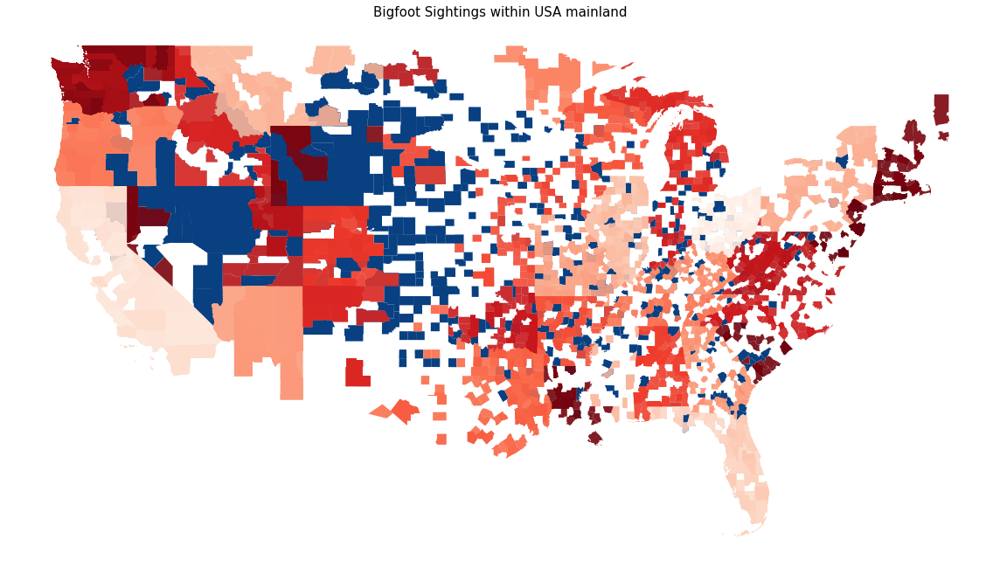

In [894]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(figsize=(16, 16))
bigfoot_ml.plot(column='latlon_inp', categorical=True, ax=ax, cax=cax, cmap='GnBu',markersize=2, marker='-', scheme='quantiles', k=2) 
bigfoot_ml[bigfoot_ml['latlon_inp'] == no].plot(scheme='quantiles', k=10, ax=ax, cmap='Reds', markersize=1, marker='.', alpha=.9) 
ax.set_title("Bigfoot Sightings within USA mainland", fontsize=15)
ax.axis('off')
plt.tight_layout()
plt.show()


This map tells the Bigfoot sightings occurred within the contiguous US. Each dot represents a sighting, and we see a dense area around the north west, north and a bit towards the east of the country. All these parts of the country have forest areas where Bigfoot is said to typically settle in. We notice that the middle part of the country where its relatively hotter climate has sporadic sightings.

In [1005]:
#Bigfoot sightings aggregated per county
bigfoot_ml['county_name']=bigfoot_ml['NAME'].str.cat(bigfoot_ml['STATE_NAME'], sep=", ").astype(str)
bigfoot_ml['sightings'] = 1
us_counties = bigfoot_ml.dissolve(by=['county_name', 'classification'], aggfunc='sum')

geometry  \
county_name           classification                                                      
Acadia, Louisiana     Class A         POLYGON ((-92.63216 30.31429, -92.61950 30.340...   
Accomack, Virginia    Class B         MULTIPOLYGON (((-75.92476 37.60021, -75.90959 ...   
Adair, Oklahoma       Class A         POLYGON ((-94.80733 35.90093, -94.79720 35.900...   
Adams, Colorado       Class A         POLYGON ((-105.05327 39.82003, -105.05285 39.8...   
Adams, Idaho          Class A         POLYGON ((-116.88360 44.85827, -116.86534 44.8...   
...                                                                                 ...   
York, Maine           Class B         POLYGON ((-70.95755 43.78512, -70.92707 43.790...   
Yuba, California      Class A         POLYGON ((-121.63578 39.26172, -121.62176 39.2...   
                      Class B         POLYGON ((-121.63578 39.26172, -121.62176 39.2...   
Yuma, Colorado        Class A         POLYGON ((-102.80377 40.00255, -102.79331 40.0...   
Ziebach, South Dakota Class B         POLYGON ((-101.99999 45.03827, -101.99979 45.4...   

                                           ALAND      AWATER  index_right  \
county_name           classification                                        
Acadia, Louisiana     Class A         1696880710     5918557         1709   
Accomack, Virginia    Class B         1163706181  2229279715         2743   
Adair, Oklahoma       Class A         1485822410     8737302          668   
Adams, Colorado       Class A         3020592854    44447105         3776   
Adams, Idaho          Class A         7059297866    34719692         1756   
...                                          ...         ...          ...   
York, Maine           Class B         5133627410  1443447964         9155   
Yuba, California      Class A         1636913845    31057995         1917   
                      Class B         1636913845    31057995         1612   
Yuma, Colorado        Class A         6123763482    11134666         1143   
Ziebach, South Dakota Class B         5079588993    24212302         4177   

                                          id  was_date_na  latlon_inp  \
county_name           classification                                    
Acadia, Louisiana     Class A           7715            0           0   
Accomack, Virginia    Class B          20257            0           0   
Adair, Oklahoma       Class A           1790            1           1   
Adams, Colorado       Class A          34502            1           1   
Adams, Idaho          Class A           6248            1           1   
...                                      ...          ...         ...   
York, Maine           Class B         108789            0           0   
Yuba, California      Class A           9202            0           0   
                      Class B           7211            0           0   
Yuma, Colorado        Class A           3684            1           1   
Ziebach, South Dakota Class B          42742            1           1   

                                       latitude   longitude  sightings  
county_name           classification                                    
Acadia, Louisiana     Class A         30.257600  -92.622100          1  
Accomack, Virginia    Class B         37.927350  -75.656100          1  
Adair, Oklahoma       Class A         35.802033  -94.751567          1  
Adams, Colorado       Class A         39.975913 -104.572947          1  
Adams, Idaho          Class A         90.062001 -232.930463          2  
...                                         ...         ...        ...  
York, Maine           Class B         86.872100 -141.435370          2  
Yuba, California      Class A         39.205000 -121.580000          1  
                      Class B         39.080000 -121.420000          1  
Yuma, Colorado        Class A         39.692500 -102.470140          1  
Ziebach, South Dakota Class B         44.863330 -101.655845        

In [1000]:
import folium
import geopandas.explore
from shapely.geometry import box

geopandas.explore._MAP_KWARGS += ["dragging", "scrollWheelZoom"]

df=us_counties.reset_index()

index=df.sindex



f = folium.Figure(width=1000, height=500)
initial_location = [sum(df.total_bounds[[1, 3]]) / 2, sum(df.total_bounds[[0, 2]]) / 2]
mlon, mlat, mxlon, mxlat = df.total_bounds
margin=4.5
m = folium.Map(location= initial_location,
               tiles="openstreetmap",
               zoom_start=5,
                min_zoom=4,
                max_zoom=10,
                min_lat=mlat-margin,
                max_lat=mxlat+margin,
                min_lon=mlon-margin,
                max_lon=mxlon+margin,
                max_bounds=True,
                width = '100%',
                height = '100%',
                zoom_control=False     
              ).add_to(f)


m = df[df['classification'] == 'Class C'].explore(m=m,
                                                  column='sightings',
                                                  scheme="naturalbreaks", 
                                                  k=1, cmap="Blues",
                                                  tooltip=['county_name', 'classification', 'sightings', 'latitude', 'longitude'],
                                                  style_kwds=dict(color="black"),  # use black outline
                                                 )
m = df[df['classification'] == 'Class B'].explore(m=m,
                                                  column='sightings',
                                                  scheme="Percentiles",
                                                  k=10,
                                                  cmap="Greens",
                                                  tooltip=['county_name', 'classification', 'sightings', 'latitude', 'longitude'],
                                                  style_kwds=dict(color="black"),  # use black outline
                                                 )
m = df[df['classification'] == 'Class A'].explore(m=m,
                                                  column='sightings',
                                                  scheme="StdMean",
                                                  k=4,
                                                  cmap="flag_r",
                                                  tooltip=['county_name', 'classification', 'sightings', 'latitude', 'longitude'],
                                                  style_kwds=dict(color="black"),  # use black outline
                                                 )

# min_zoom=0, max_zoom=18, zoom_start=10, min_lat=- 90, max_lat=90, min_lon=- 180, max_lon=180, max_bounds=False,

# folium.TileLayer('Stamen Toner', control=True).add_to(m)  # use folium to add alternative tiles
folium.TileLayer('Stamen Watercolor', control=True).add_to(m)  # use folium to add alternative tiles
folium.LayerControl().add_to(m)  # use folium to add layer control

m
# .explore(tooltip='county_name', scheme="quantiles", k=6)

/Users/soubhik1c/Downloads/MA705/project/condaenv6/lib/python3.10/site-packages/mapclassify/classifiers.py:891: RuntimeWarning: invalid value encountered in double_scalars
  gadf = 1 - self.adcm / adam


In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))
geopandas.GeoSeries(unary_union(geo_counties.geometry)).plot(ax=ax, color='white') 
sightings_2.plot( ax=ax, column='count', edgecolor='lightgreen', cmap="Greens", legend=True)

ax.set_title("Number of Bigfoot sightings per county", fontsize=20)
ax.axis('off')

cb = fig.axes[1]
cb.set_title("Maximum Sightings",  fontsize=10)
cb.set_xlabel("Minimum Sightings",  fontsize=10)
cb.tick_params(size = 8, labelsize=8)

This map helps to solidify our earlier observations. This is a map where we see the number of sightings in each county of the US. The darker the region, the more sightings there have been recorded. We see the maximum number of sightings have been in the counties of the state of Washington. We see that there have been sightings in areas that aren’t particularly densely populated. In areas of maximum sightings, the climate is relatively and generally colder, particularly in Washington which could help explain the huge, fleshy and furry appearance of Bigfoot. Also, to note, the coastal regions like California, Florida, the East Coast states have experienced minimal sightings.